This is just to show you How my script works basically you have to open this file hexlify the data and then run it through my ncp_to_json script. I will then load the JSON to a pandas dataframe. Then filter it to one source and one freq range. Converting the lvls column to a numpy array and finally creating the xarray. I can then save the xarray as a zarr file, then open it again. 

My intention is not to use this NCP -> JSON -> Pandas -> Numpy -> Xarray -> Zarr method. I need to rewrite my script to create the Xarray then save to zarr from the beggining.

This is only intended to show you how it works

In [2]:
import ncp #my ncp script
import binascii
import pandas as pd
import numpy as np

file = open("RFEYE.ncp", "rb") # opening for [r]eading as [b]inary
data = file.read() # if you only wanted to read 512 bytes, do .read(512)
file.close()
data = binascii.hexlify(data)
json = ncp.ncp_to_json(data)

In [3]:
df = pd.read_json(json)
df

,source_id,start_frq,stop_frq,timestamp,lvls
0,2299527971,224.884033,400.115966,2022-01-05 14:28:03.519932160,"[-99.5, -104.5, -104.5, -103.5, -107.5, -118.0..."
1,2299527971,29.975891,88.005065,2022-01-05 14:28:03.526998784,"[-114.5, -109.0, -107.5, -107.5, -104.0, -99.5..."
2,2299527958,29.975891,88.005065,2022-01-05 14:28:03.544357888,"[-77.5, -81.0, -81.0, -81.0, -81.0, -81.0, -81..."
3,2299527958,224.884033,400.115966,2022-01-05 14:28:03.571024128,"[-117.0, -112.0, -111.5, -115.0, -116.0, -111...."
4,2299527971,29.975891,88.005065,2022-01-05 14:28:03.627290368,"[-100.0, -100.5, -103.5, -109.0, -101.5, -100...."
...,...,...,...,...,...
11026,2299527958,29.975891,88.005065,2022-01-05 14:32:40.364701696,"[-89.5, -88.5, -93.5, -86.0, -81.5, -81.5, -85..."
11027,2299527958,224.884033,400.115966,2022-01-05 14:32:40.381052928,"[-110.5, -110.0, -111.5, -113.5, -111.5, -110...."
11028,2299527971,29.975891,88.005065,2022-01-05 14:32:40.424131328,"[-125.0, -119.5, -119.5, -116.5, -116.0, -112...."
11029,2299527971,224.884033,400.115966,2022-01-05 14:32:40.417126400,"[-102.5, -101.0, -102.0, -100.0, -97.5, -99.0,..."


In [4]:
df['lvls'] = df['lvls'].apply(lambda x: np.array(x))
source_df = df[(df.source_id == 2299527971) & (df.start_frq == 29.975891)].reset_index()

In [5]:
array = np.vstack(source_df.lvls.to_numpy())
freqs = np.linspace(source_df.start_frq[0],source_df.stop_frq[0],len(source_df.lvls[0]))
times = source_df.timestamp.to_numpy()

In [6]:
import xarray as xr
da = xr.DataArray(np.swapaxes(array, 0, 1), coords=[freqs,times], dims=['frequency','time'])
da

<xarray.DataArray (frequency: 3804, time: 2753)>
array([[-114.5, -100. , -103.5, ..., -112.5, -132. , -125. ],
       [-109. , -100.5, -100. , ..., -112. , -125.5, -119.5],
       [-107.5, -103.5,  -99.5, ..., -115.5, -124.5, -119.5],
       ...,
       [ -91. ,  -62. ,  -75. , ...,  -75. ,  -68. ,  -92.5],
       [ -70.5,  -68. ,  -65. , ...,  -64.5,  -62.5,  -70.5],
       [ -63. ,  -86.5,  -61.5, ...,  -62. ,  -63. ,  -62.5]])
Coordinates:
  * frequency  (frequency) float64 29.98 29.99 30.01 30.02 ... 87.97 87.99 88.01
  * time       (time) datetime64[ns] 2022-01-05T14:28:03.526998784 ... 2022-0...

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
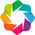

:DynamicMap   []
   :Image   [frequency,time]   (z)

In [7]:
import holoviews as hv
from holoviews.operation.datashader import regrid
hv.extension('bokeh')
hv.config.image_rtol = 1
image = hv.Image(da).opts(cmap='jet', height=250, width=500, tools=['hover'])
regrided = regrid(image)
regrided

In [8]:
#save data_array as zarr file
da.to_dataset(name='power').to_zarr("test.zarr")

In [9]:
#open zarr file
ds = xr.open_zarr("test.zarr")

In [10]:
image = hv.Image(ds).opts(cmap='jet', height=250, width=500, tools=['hover'])
regrided = regrid(image)
regrided

:DynamicMap   []
   :Image   [frequency,time]   (power)

In [11]:
ds

<xarray.Dataset>
Dimensions:    (frequency: 3804, time: 2753)
Coordinates:
  * frequency  (frequency) float64 29.98 29.99 30.01 30.02 ... 87.97 87.99 88.01
  * time       (time) datetime64[ns] 2022-01-05T14:28:03.526998784 ... 2022-0...
Data variables:
    power      (frequency, time) float64 dask.array<chunksize=(476, 345), meta=np.ndarray>